# Analysis — Many Laser Powers

In [1]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np
np.seterr('warn')

from aux_functions import shorten_points
from treament_tcspc_data import fetch_data_filenames, extract_data_info_from_path, get_xf_yf_fund, get_mean_amp_and_phase, get_fft

## Configuração
Edite apenas esta célula para adicionar/remover partículas ou frequências.

In [2]:
# filenames_all = fetch_data_filenames("./20-05-26")
filenames_all = fetch_data_filenames("./26-05-26_27-05-26")

In [3]:
# filenames_all = fetch_data_filenames("./23-05-26")
exc_data_npy = [
    extract_data_info_from_path(data_path_npy) for data_path_npy in filenames_all 
    if ("step" in data_path_npy) and (".npy" in data_path_npy) and ("exc_laser" in data_path_npy)
    ]

In [4]:
#Populate particle list

num_particles = 14
p_list = [
    {
        "p_label": p_id+1,
        "p_data": [
            extract_data_info_from_path(p_data_path)
            for p_data_path in filenames_all
            if (f"p{p_id+1}_lum" in p_data_path) and ("step" in p_data_path) and (".npy" in p_data_path)
        ]
    }
    for p_id in range(num_particles)
]

In [5]:
freq_list = sorted(set([dic["freq"] for dic in exc_data_npy]))
power_label = sorted(list(range(150, 850, 50)), reverse=True)

# Layout dos subplots de verificação visual
cols = 4
rows = int(np.ceil(len(freq_list) / cols))
    

## Análise — loop sobre N partículas

### Filtering p10 freq 3

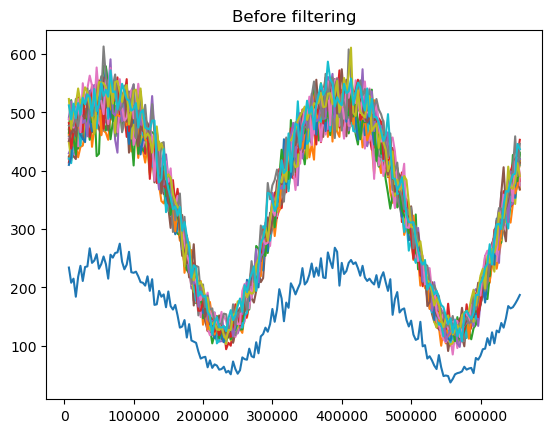

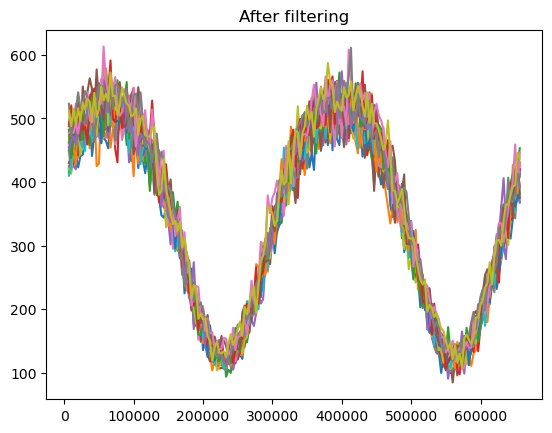

In [6]:
for el in p_list[9]["p_data"][2]["data"]:
    plt.plot(el[:,0], el[:,1])
plt.title("Before filtering")
plt.show()

def filter_list(original_list: list, elements_to_remove: list):
    filtered_list = [
        el for idx, el in enumerate(original_list) if not (idx in elements_to_remove) 
    ]
    return filtered_list

p_list[9]["p_data"][2]["data"] = filter_list(p_list[9]["p_data"][2]["data"], [0])

for el in p_list[9]["p_data"][2]["data"]:
    plt.plot(el[:,0], el[:,1])
plt.title("After filtering")
plt.show()

### Plot all


  Processing particle 1  


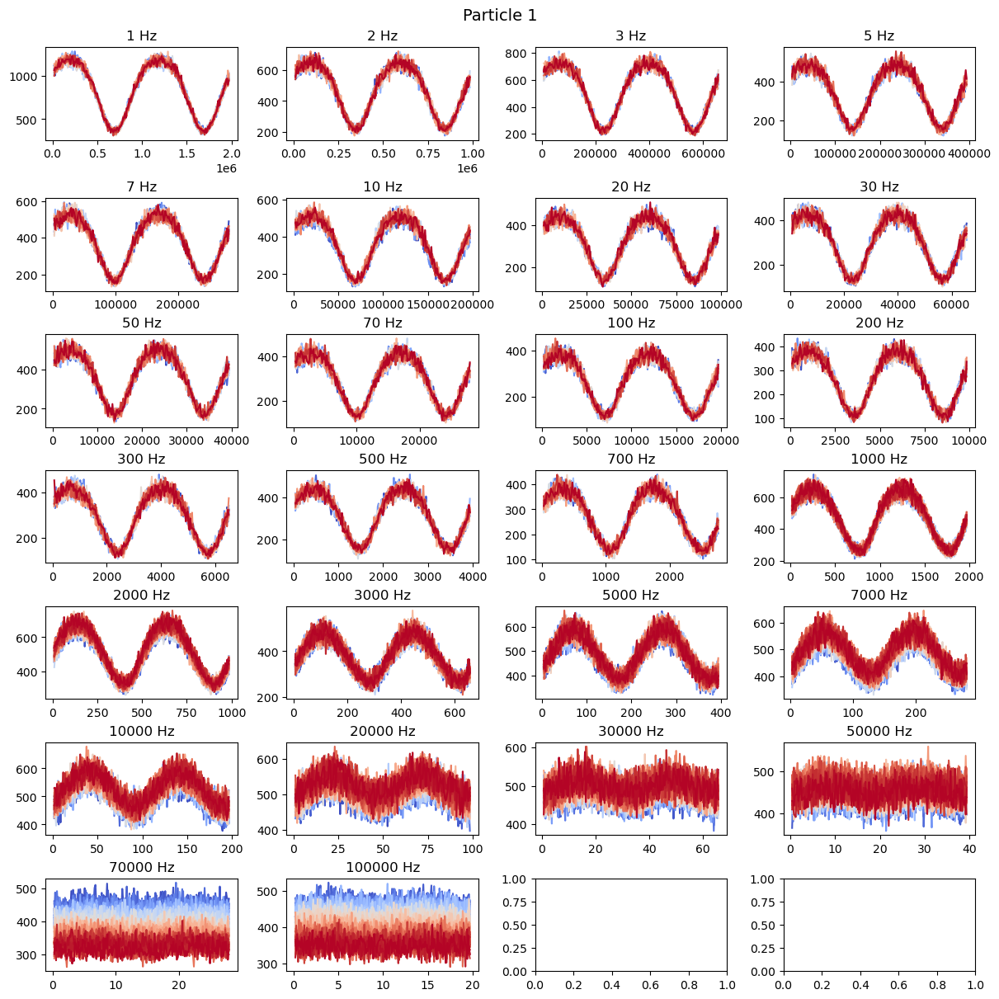


  Processing particle 2  


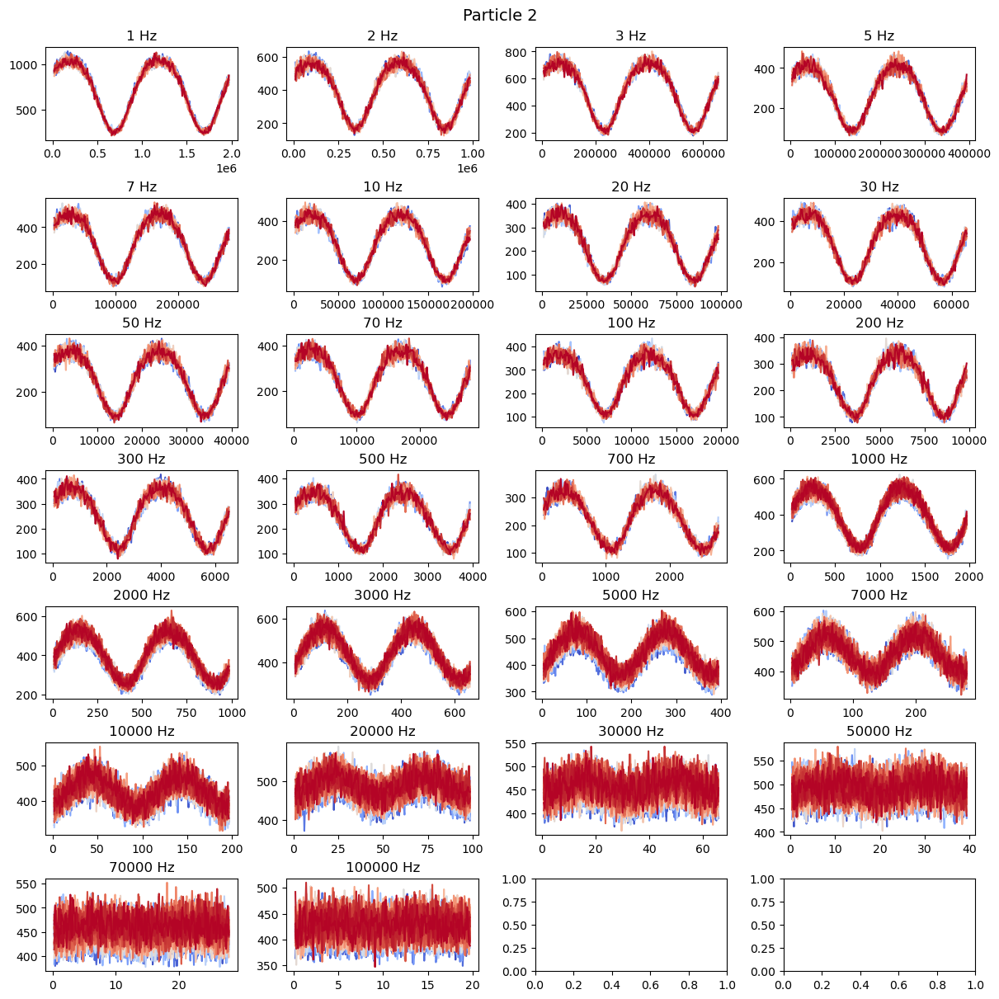


  Processing particle 3  


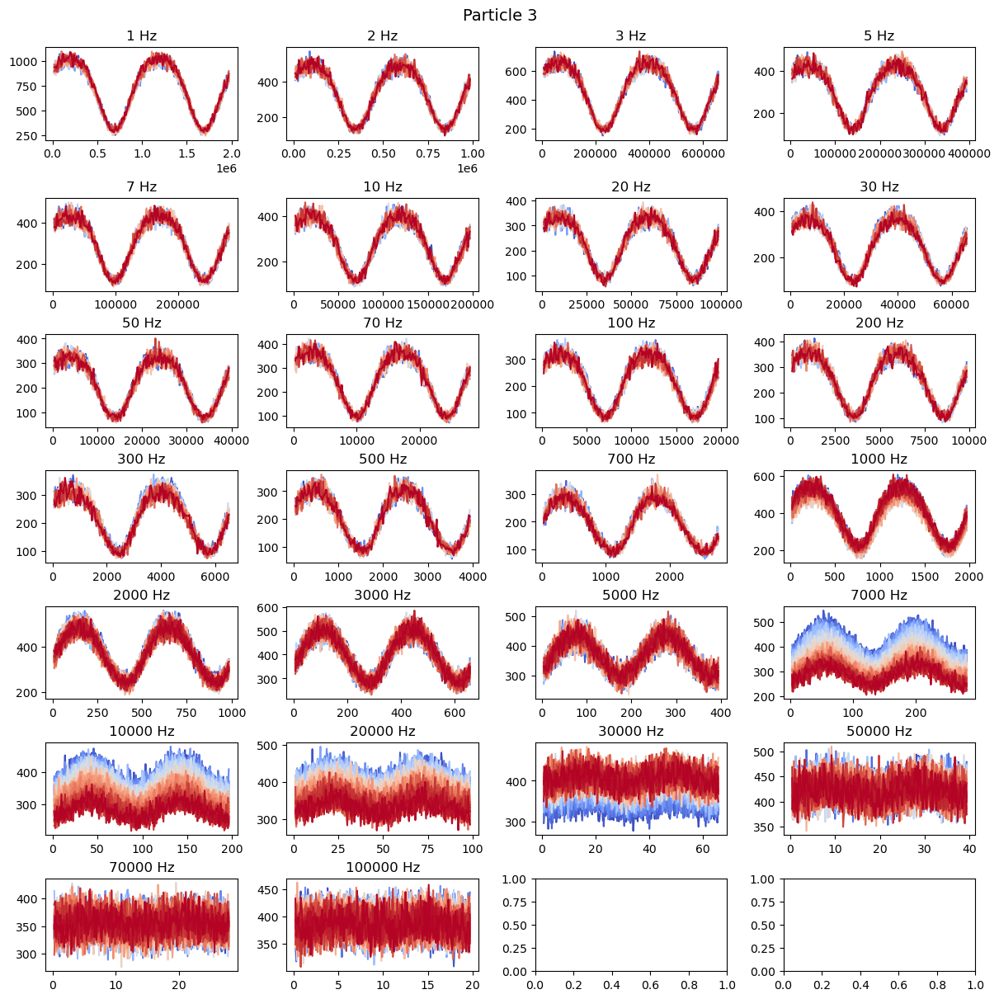


  Processing particle 4  


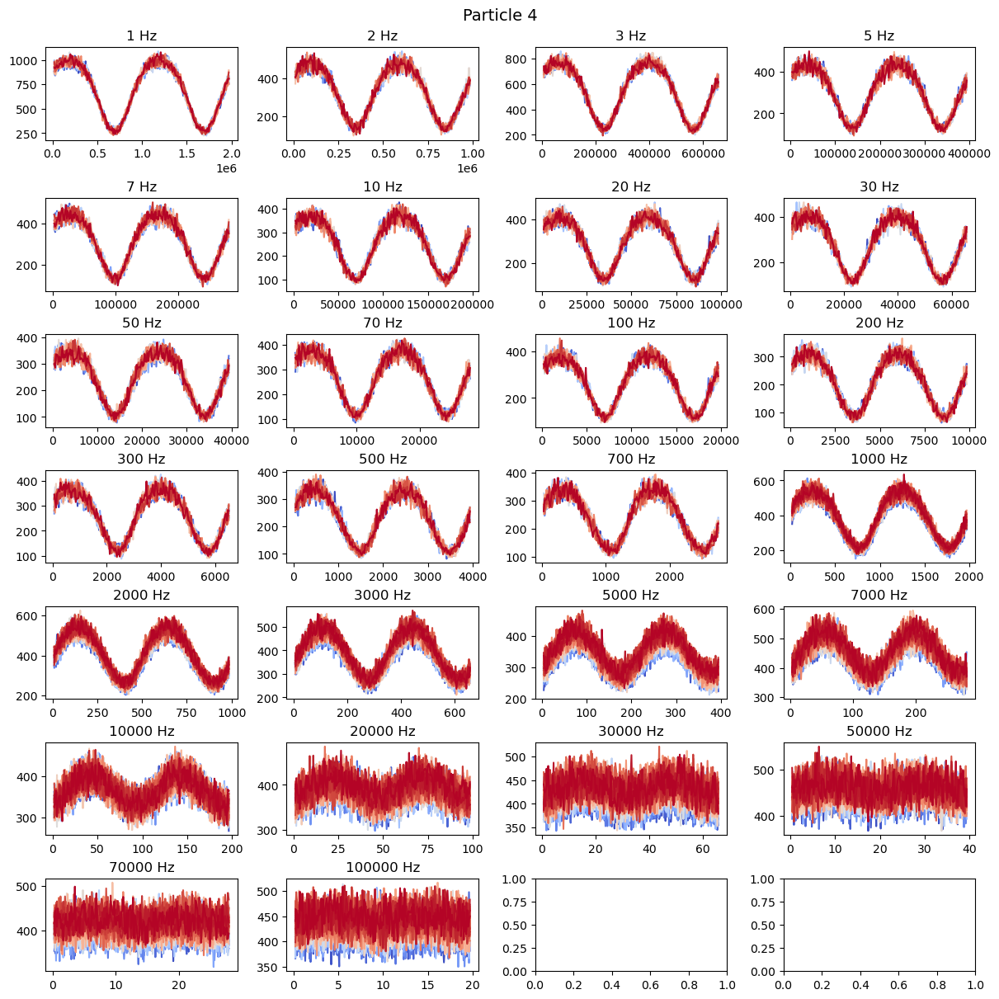


  Processing particle 5  


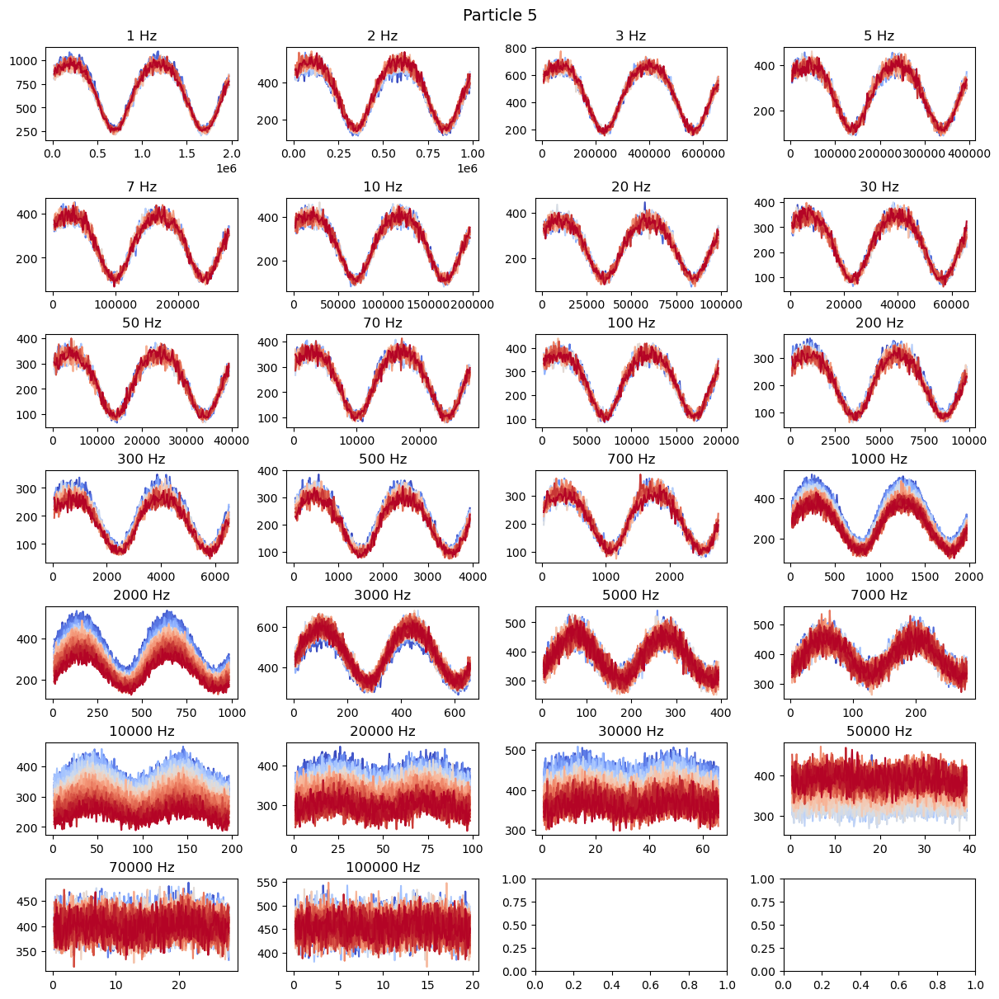


  Processing particle 6  


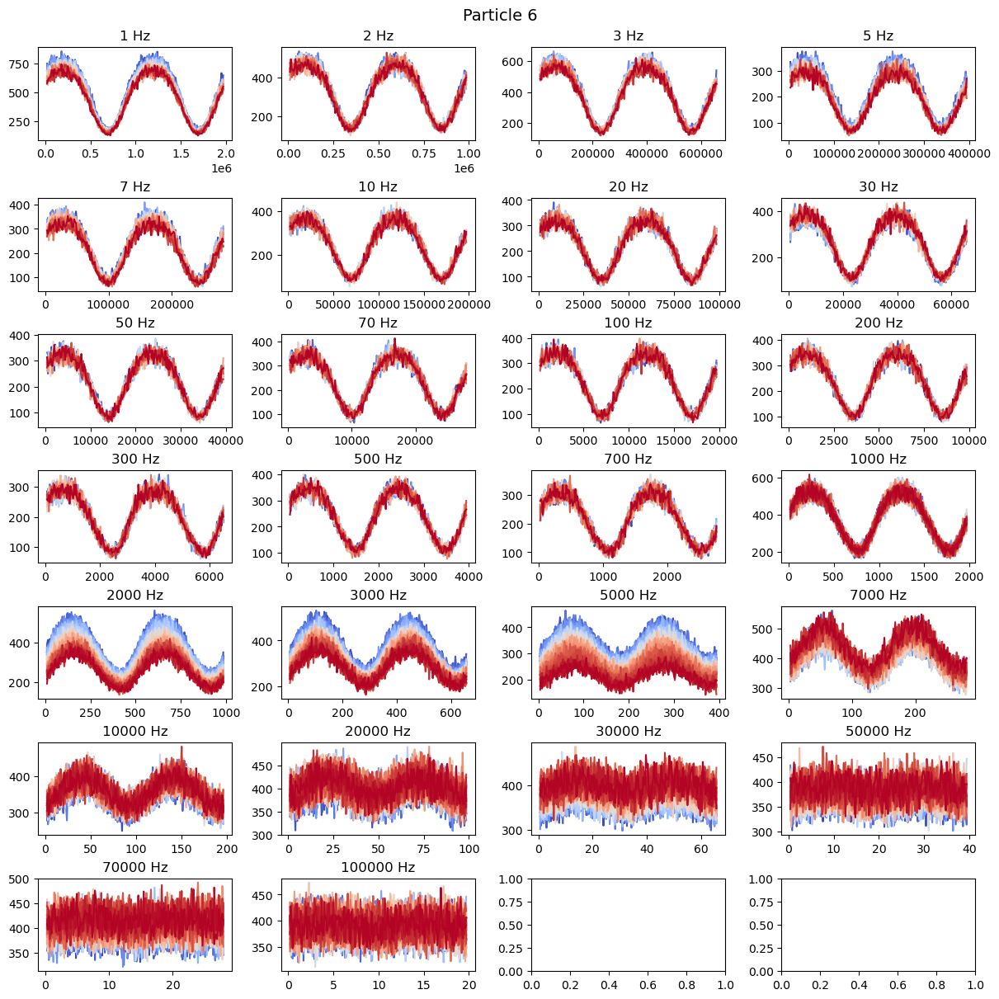


  Processing particle 7  


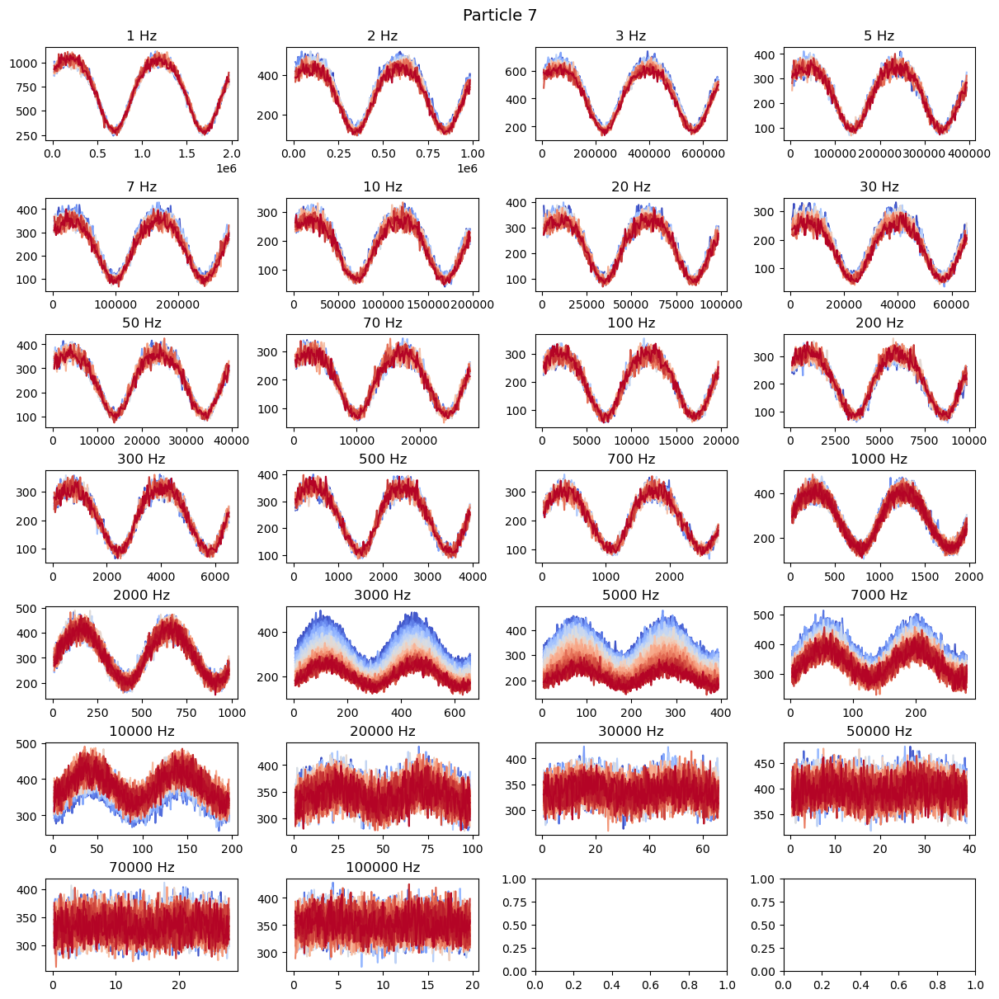


  Processing particle 8  


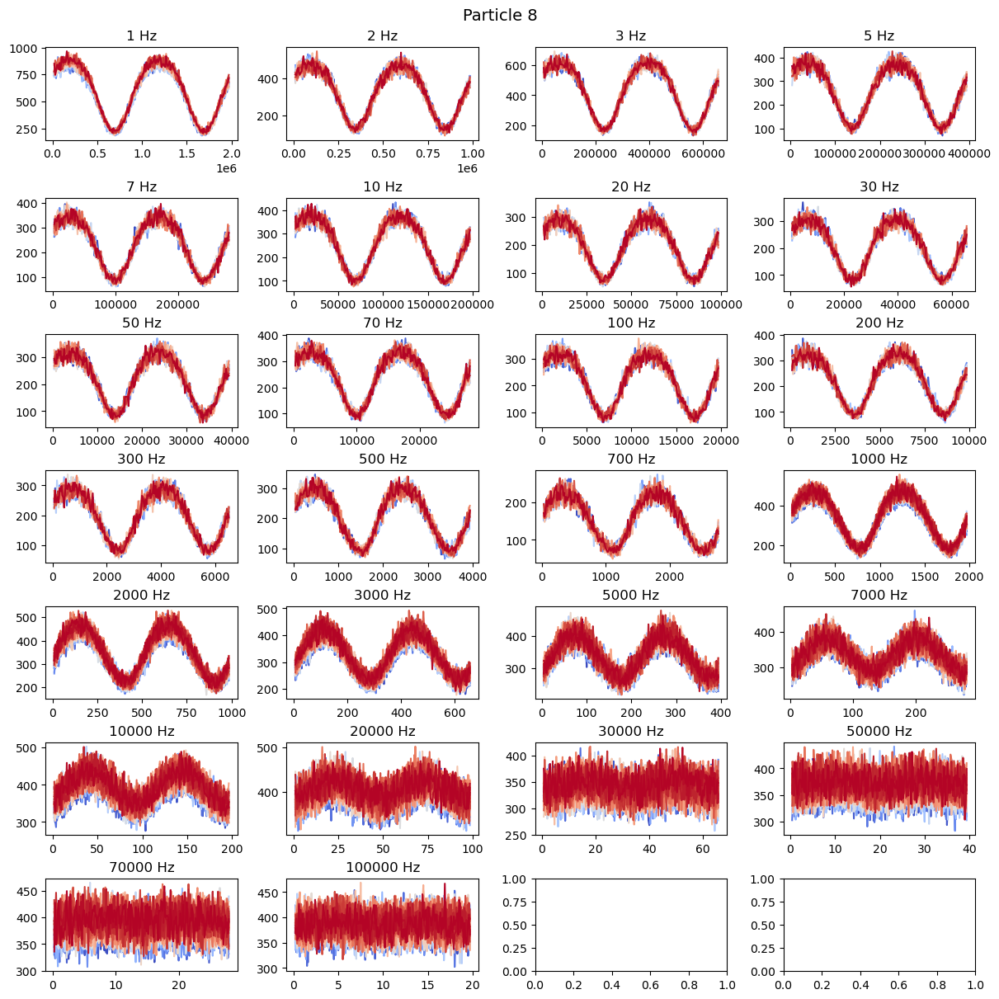


  Processing particle 9  


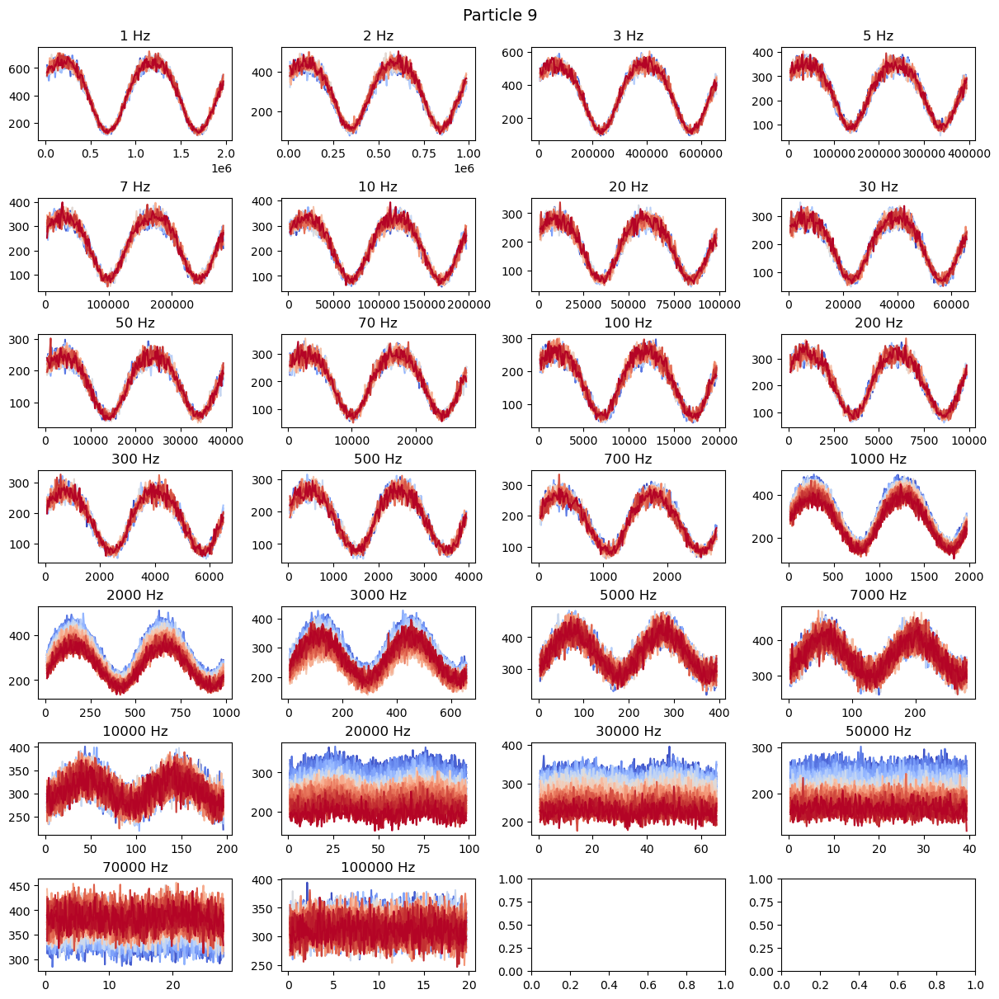


  Processing particle 10  


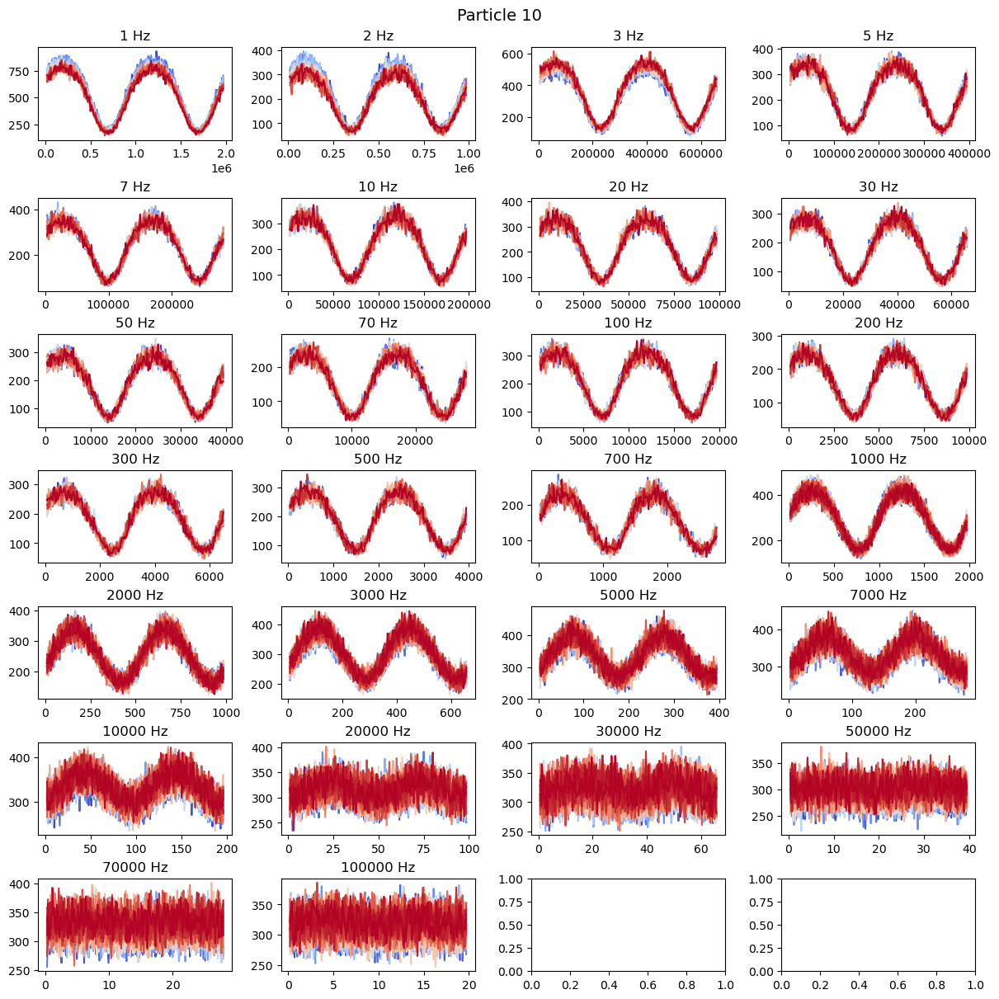


  Processing particle 11  


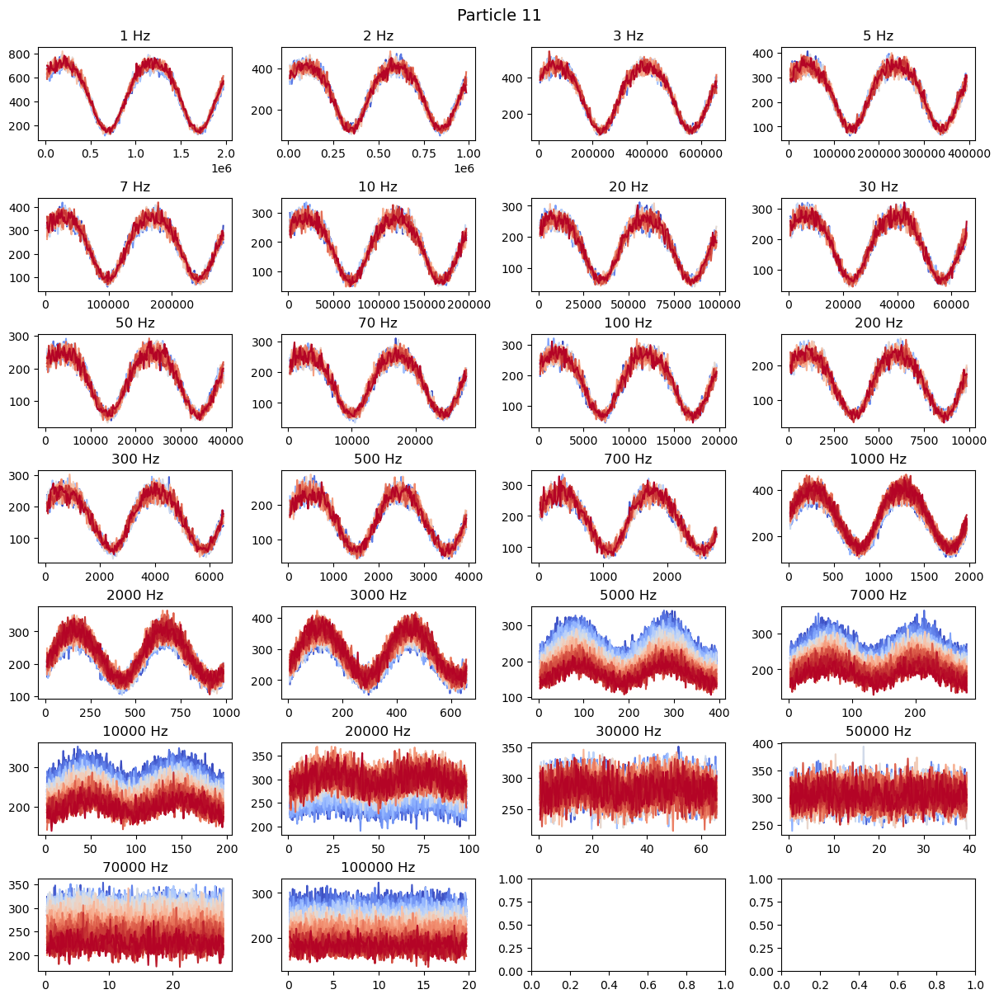


  Processing particle 12  


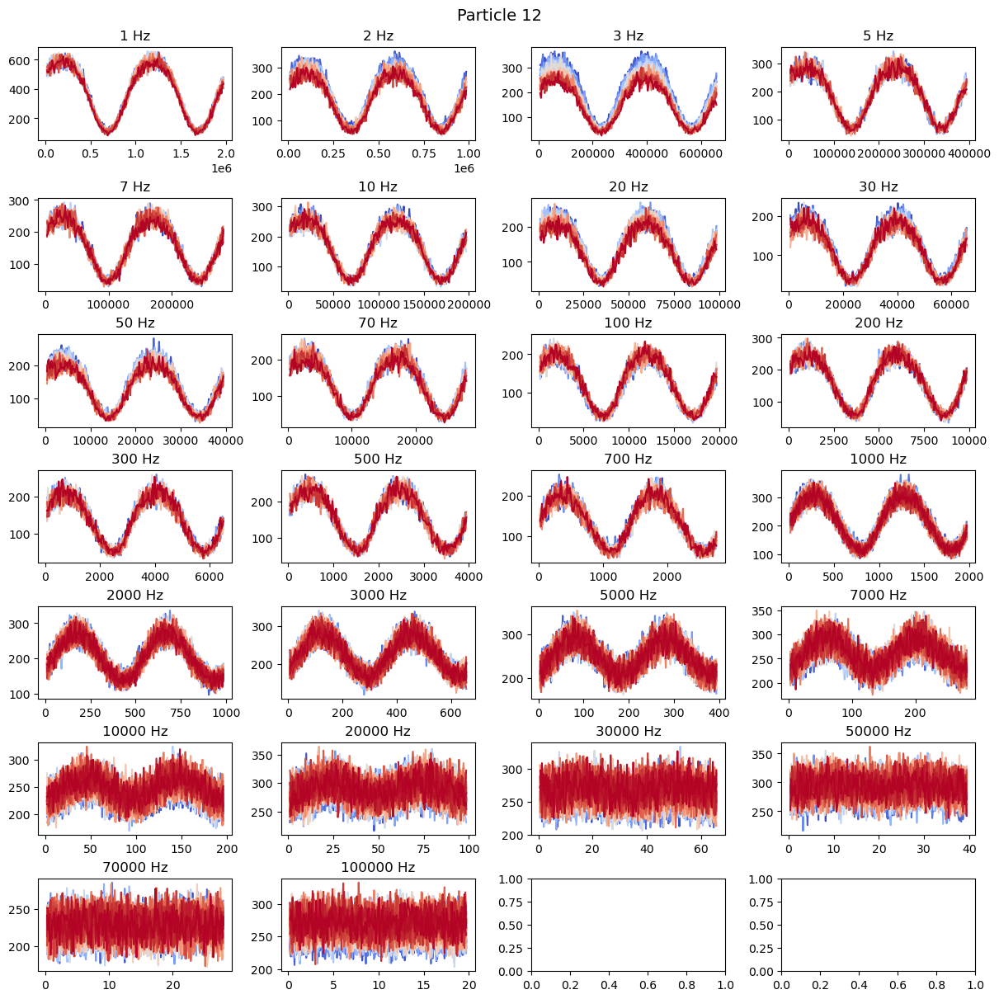


  Processing particle 13  


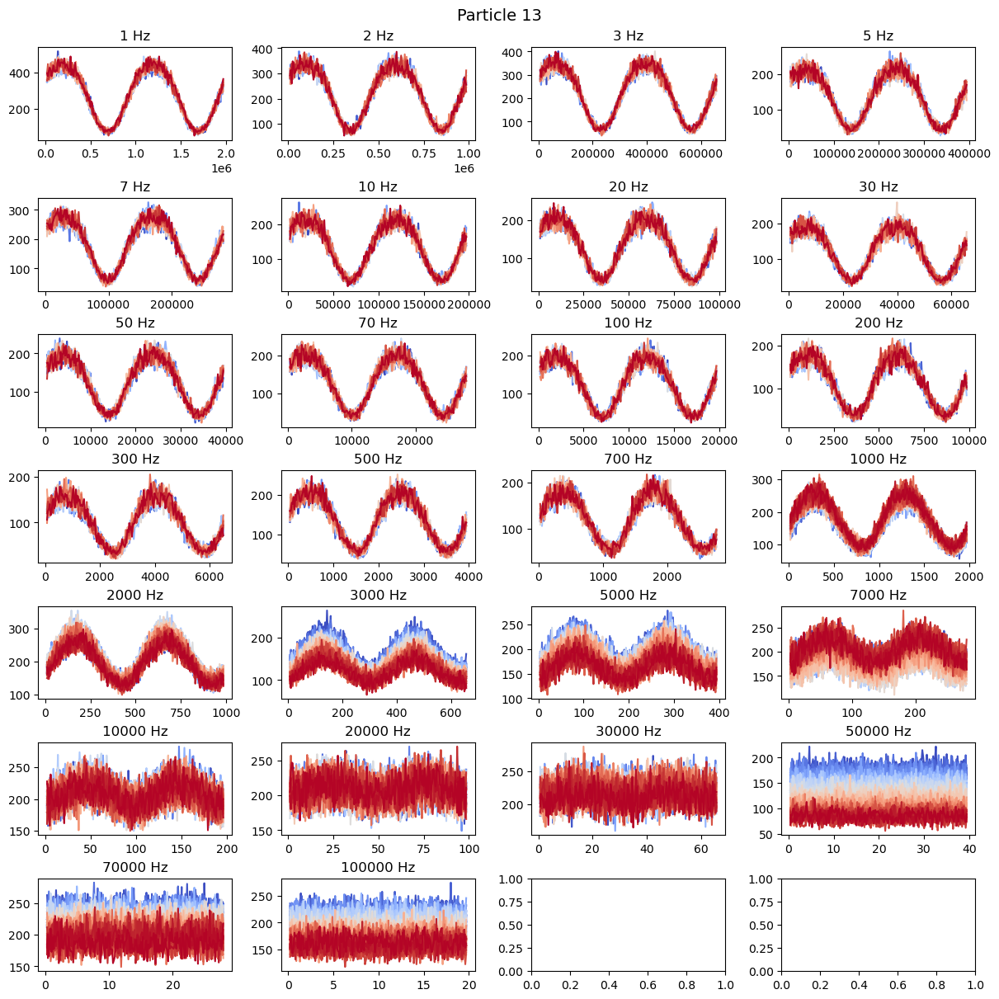


  Processing particle 14  


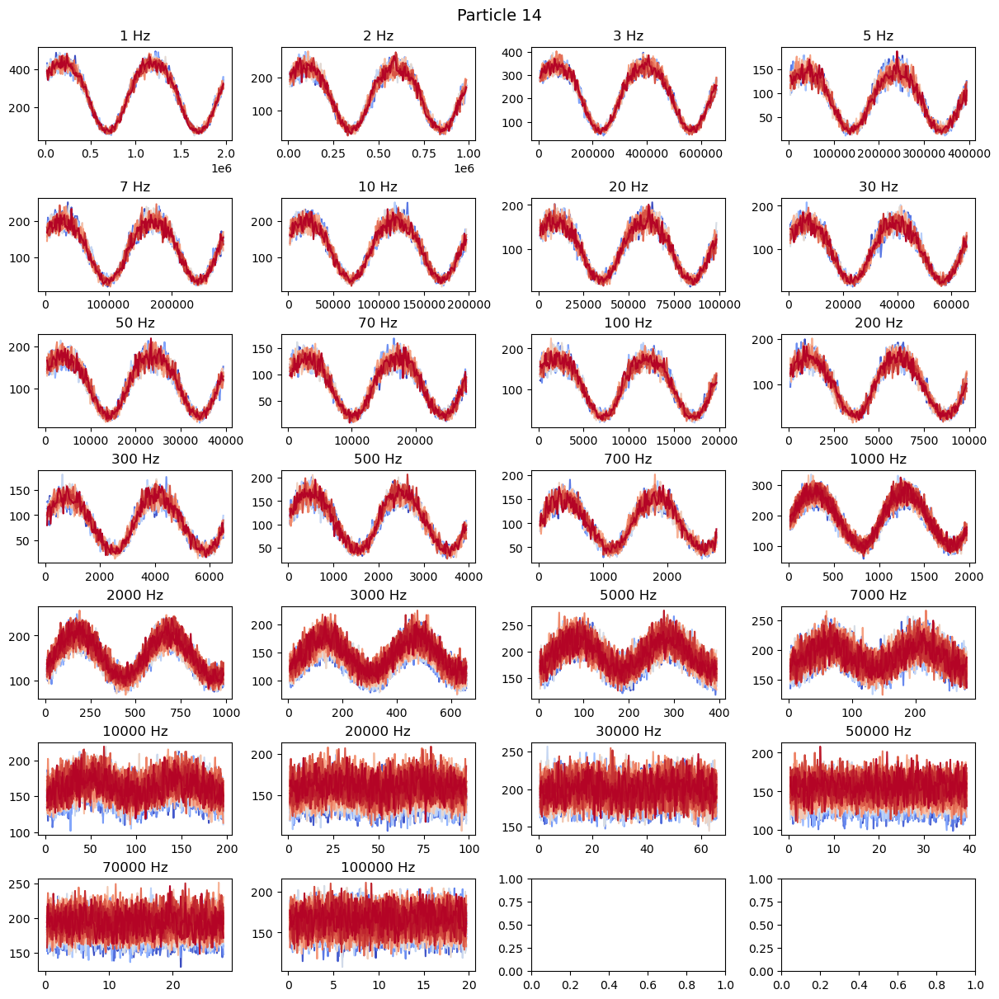

In [7]:
def time_domain_visual_verification(particles: list):

    for p_idx, p_dic in enumerate(particles):
        
        print(f"\n{'='*50}")
        print(f"  Processing particle {p_dic['p_label']}  ")
        print(f"{'='*50}")

        omegas      = []
        phase_diffs = []

        # ---- Subplots de verificação visual ----
        fig, axs = plt.subplots(rows, cols, figsize=(12, 12), constrained_layout=True)
        fig.suptitle(f"Particle {p_dic["p_label"]}", fontsize=14)

        # data = p_dic["p_data"]

        for index, step_data in enumerate(p_dic["p_data"]):
            freq = step_data["freq"]
            i, j = divmod(index, cols)
            omega = 2 * np.pi * float(freq) * 1e-6
            omegas.append(omega)

            cmap = plt.get_cmap("coolwarm")
            norm = mcolors.Normalize(vmin=0, vmax = (len(step_data["data"])-1) )

            ax = axs[i, j]
            for idx_rep, rep in enumerate(step_data["data"]):
                c_grad = cmap(norm(idx_rep))
                ax.plot(rep[:,0], rep[:,1], color=c_grad)

            ax.set_title(f"{freq} Hz")


        plt.show()

time_domain_visual_verification(p_list)

## Get mean phases and errors

In [8]:
#Calculate list of phasors for the laser and all measurements
for step in exc_data_npy:
  freq = step["freq"]
  step["fft_amp_list"] = []
  for meas_idx, meas in enumerate(step["data"]):
    _, amp = get_xf_yf_fund(meas[:,0], meas[:,1])
    step["fft_amp_list"].append(amp)

In [9]:
# Get mean phase and error for each particle and each step (freq) 
for step in exc_data_npy:
    freq = step["freq"]
    amp_list = step["fft_amp_list"]
    _, _, phase, phase_error = get_mean_amp_and_phase(amp_list)
    step["mean_fft_info"] = [freq, phase, phase_error]

In [10]:
#Calculate list of phasors for all particles and all measurements
for p in p_list:
  for step in p["p_data"]:
    freq = step["freq"]
    step["fft_amp_list"] = []
    for meas_idx, meas in enumerate(step["data"]):
      _, amp = get_xf_yf_fund(meas[:,0], meas[:,1])
      step["fft_amp_list"].append(amp)

In [11]:
# Get mean phase and error for each particle and each step (freq) 
for p in p_list:
    for step in p["p_data"]:
        freq = step["freq"]
        amp_list = step["fft_amp_list"]
        _, _, phase, phase_error = get_mean_amp_and_phase(amp_list)
        step["mean_fft_info"] = [freq, phase, phase_error]

## Comparison — all particles

In [12]:
def get_error_bar(exc_data, p_list):
    exc_mean_phase = np.array([
            step["mean_fft_info"]
            #[freq, phase, phase_error]
            for step in exc_data
        ])
    error_exc = exc_mean_phase[:,2]
    # print(error_exc)

    for p in p_list:
        # if p["p_label"] !=1: continue
        p_mean_phase = np.array([
            step["mean_fft_info"]
            for step in p["p_data"]
            ])
        
        if (p_mean_phase[:,0]-exc_mean_phase[:,0]).sum() != 0.:
            print("Deu ruim!")
            return None
        else:
            pd_list = np.unwrap(p_mean_phase[:,1]-exc_mean_phase[:,1])
            pd_error = np.hypot(
                p_mean_phase[:,2],
                exc_mean_phase[:,2]
            )

        p["error_bar"] = np.column_stack((p_mean_phase[:,0], pd_list, pd_error))

get_error_bar(exc_data_npy, p_list)

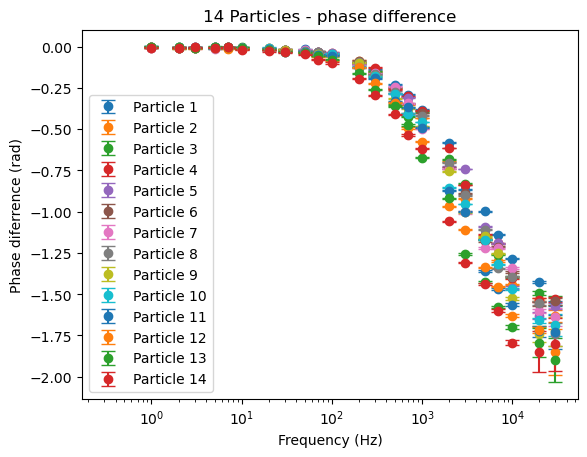

In [13]:
def plot_phase_difference(particles: list, p_to_skip = [], freqs_to_skip = []):
    colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]

    for p_id, p in enumerate(particles):
        if p["p_label"] in p_to_skip: continue
        color = colors[p_id % len(colors)]
        # p["error_bar"]
        label_added = False
        for idx, error_point in enumerate(p["error_bar"]):
            # Skip frequencies larger than 20kHz
            if (error_point[0] in freqs_to_skip): 
                # print(f"Não foi calculado pra freq: {error_point[0]}Hz")
                continue
            
            current_label = f"Particle {p['p_label']}" if not label_added else None

            plt.errorbar(
                error_point[0],
                error_point[1],
                yerr=error_point[2],
                label=current_label,
                fmt='o',
                capsize=5,
                color=color,
            )
            label_added = True
        # plt.title(f"Particle {p['p_label']}  - phase difference")
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Phase diferrence (rad)")
        plt.xscale("log")
    
    if len(particles)>1:
        plt_title = f"{len(particles)} Particles - phase difference" 
    else:
        plt_title = f"{len(particles)} Particle - phase difference" 

    plt.title(plt_title)
    plt.legend()
    plt.show()

plot_phase_difference(p_list, p_to_skip=[], freqs_to_skip=[50000, 70000, 100000])

## Signal-Noise relation

In [14]:
def get_snr_db(time, curve, freq=1):
    """
    Calculate the Signal-Noise Relation (SNR) in dB.
    
    Parâmeters:
      freq = 0: The 'signal' is the DC component (zero frequency).
      freq = 1: The 'signal' is the fundamentabl frequency (largest AC spike).
      freq = 1: The 'signal' is 2nd harmonic (2*fundamental_frequency).

    The remaining power of the spectrum is considered noise.
    """
    # 1. Obtém a FFT usando a sua função existente
    xf, yf = get_fft(time, curve)
    
    # 2. Mantém o termo DC e as frequências positivas
    mask_positive = xf >= 0
    xf = xf[mask_positive]
    yf = yf[mask_positive]
    
    # 3. Calcula o espectro de potência (módulo ao quadrado)
    power = np.abs(yf)**2

    # 4. Encontra a frequência fundamental (omega)
    # Ignoramos temporariamente o termo DC para garantir que acharemos o maior pico AC
    power_ac = np.copy(power)
    power_ac[xf == 0] = 0 

    idx_fund = np.argmax(power_ac)
    
    freq_fund = xf[idx_fund]

    idx_dc = np.argmin(np.abs(xf))
    idx_2omega = np.argmin(np.abs(xf - 2*freq_fund))

    
    # 5. Seleciona o índice do sinal de interesse com base no parâmetro 'freq'
    if freq == 0:
        # Sinal é o termo DC (frequência mais próxima de 0)
        idx_signal = idx_dc
        
    elif freq == 1:
        # Sinal é a frequência fundamental (omega)
        idx_signal = idx_fund
        
    elif freq == 2:
        # Sinal é o segundo harmônico (2 * omega)
        idx_signal = idx_2omega
        
    else:
        raise ValueError("O parâmetro 'freq' deve ser 0, 1 ou 2.")

    # Extrai a potência do sinal selecionado
    p_signal = power[idx_signal]
    
    # Opcional: print para debug/verificação
    # print(f"Modo: freq={freq} | Freq Sinal: {xf[idx_signal]:.4f} Hz | Idx: {idx_signal}")

    # Remove a contribuição do DC para o cálculo do ruído (se o sinal não for o DC)
    if freq != 0:
        # Encontra o índice da frequência 0 (geralmente é o índice 0)
        power[idx_dc] = 0.0
    
    # 6. Identifica a potência do Ruído (Potência total - Potência do sinal)
    p_noise = (np.sum(power) - power[idx_fund] - power[idx_dc] - power[idx_2omega])/(len(power)-3)
    
    # Tratamento de segurança: se o sinal for uma senoide perfeita simulada
    if p_noise <= 1e-15:
        return float('inf') 
        
    # 7. Calcula a razão em dB
    snr_db = 10 * np.log10(p_signal / p_noise)
    
    return snr_db

def plot_time_and_freq_domain(time, lum_curve, laser_curve):
    """Plot time and frequency domain of the luminescence and laser curves"""
    # Suponho que a função get_fft já esteja definida no seu código
    xf_laser, yf_laser = get_fft(time, laser_curve)
    xf_lum, yf_lum = get_fft(time, lum_curve)
    
    # Filtering only positive frequencies
    lum_mask = xf_lum > 0
    xf_lum = xf_lum[lum_mask]
    yf_lum = yf_lum[lum_mask]
    laser_mask = xf_laser > 0
    xf_laser = xf_laser[laser_mask]
    yf_laser = yf_laser[laser_mask]

    fig, axs = plt.subplots(2, 1, figsize=(10, 6), constrained_layout=True)

    # --- DOMÍNIO DO TEMPO ---
    # Eixo principal (Esquerdo - Verde/Lum)
    axs[0].set_xlabel("Time ($\mu$s)")
    axs[0].set_ylabel("Luminescence (a.u.)", color="tab:green")
    line1 = axs[0].plot(time*(1e-6), lum_curve, color="tab:green", label="lum")
    axs[0].tick_params(axis='y', labelcolor="tab:green")
    axs[0].set_title("Time Domain")

    # Eixo secundário (Direito - Vermelho/Laser)
    ax0_twin = axs[0].twinx()
    ax0_twin.set_ylabel("Laser (a.u.)", color="tab:red")
    line2 = ax0_twin.plot(time*(1e-6), laser_curve, color="tab:red", label="laser")
    ax0_twin.tick_params(axis='y', labelcolor="tab:red")

    # Juntando as legendas dos dois eixos
    lines_time = line1 + line2
    labels_time = [l.get_label() for l in lines_time]
    axs[0].legend(lines_time, labels_time, loc="best")


    # --- DOMÍNIO DA FREQUÊNCIA ---
    # Eixo principal (Esquerdo - Verde/Lum)
    axs[1].set_xlabel("Frequency (Hz)")
    axs[1].set_ylabel("Lum Amplitude", color="tab:green")
    line3 = axs[1].plot(xf_lum, np.abs(yf_lum), color="tab:green", label="lum")
    axs[1].tick_params(axis='y', labelcolor="tab:green")
    axs[1].set_title("Frequency Domain")

    # Eixo secundário (Direito - Vermelho/Laser)
    ax1_twin = axs[1].twinx()
    ax1_twin.set_ylabel("Laser Amplitude", color="tab:red")
    line4 = ax1_twin.plot(xf_laser, np.abs(yf_laser), color="tab:red", label="laser")
    ax1_twin.tick_params(axis='y', labelcolor="tab:red")

    # Juntando as legendas dos dois eixos
    lines_freq = line3 + line4
    labels_freq = [l.get_label() for l in lines_freq]
    axs[1].legend(lines_freq, labels_freq, loc="best")

    plt.show()

### SNR for fundamental frequency $\omega$ and phase shift error 

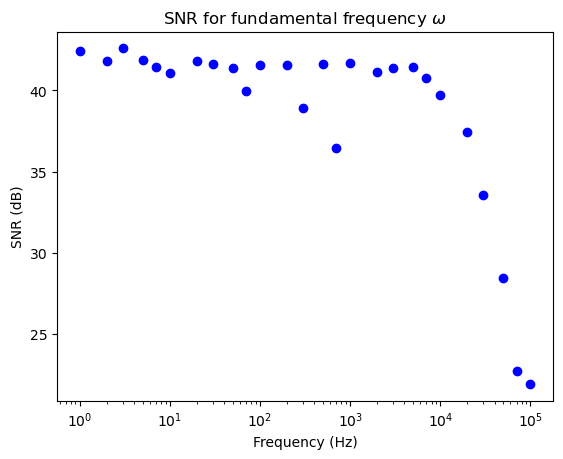

In [15]:
p_idx = 0

snr_list = []

for step_idx, step in enumerate(p_list[p_idx]["p_data"]):
    # if step["freq"] < 10: continue
    # print(f"freq: {step["freq"]}Hz")

    signal = np.array(step["data"])
    # laser_signal = np.array(next(exc["data"] for exc in exc_data_npy if exc["freq"] == step["freq"]))
    
    snr_list.append([
        step["freq"],
        get_snr_db(signal[0,:,0], signal[:,:,1].mean(axis=0)),
    ])

snr_list = np.array(snr_list)


# snr_list
p_idx = 0
for idx, item in enumerate(p_list[p_idx]["error_bar"]):
    # Freq match
    if item[0] == snr_list[idx,0]:
        plt.scatter(snr_list[idx,0], snr_list[idx,1], color="blue")

plt.title("SNR for fundamental frequency $\omega$")
plt.ylabel("SNR (dB)")
plt.xlabel("Frequency (Hz)")
plt.xscale("log")
plt.show()


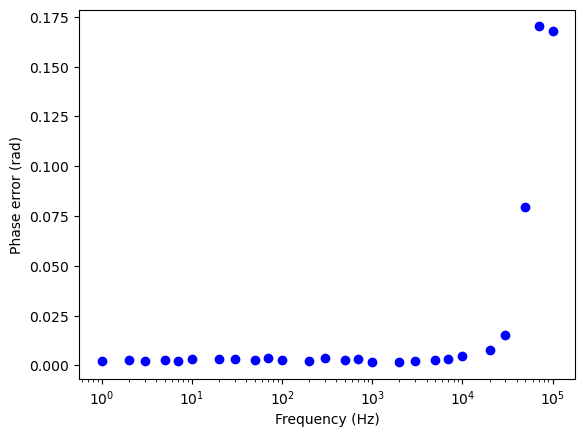

In [16]:
p_idx = 0

for idx, item in enumerate(p_list[p_idx]["error_bar"]):
    # Freq match
    if item[0] == snr_list[idx,0]:
        plt.scatter(snr_list[idx,0], item[2], color="blue")

plt.xlabel("Frequency (Hz)")
plt.ylabel("Phase error (rad)")
plt.xscale("log")
plt.show()

### SNR for $2\omega$

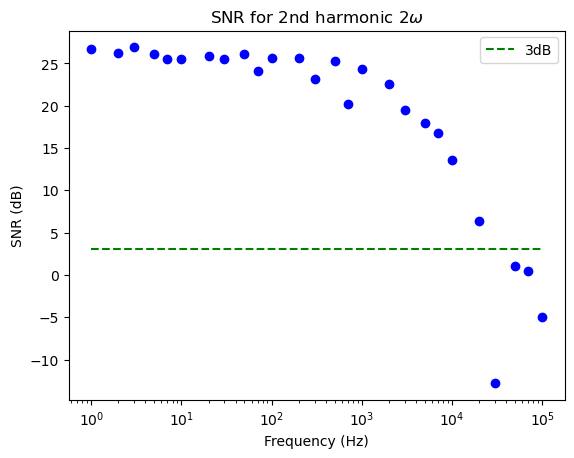

In [17]:
p_idx = 0
snr_2omega_list = []

for step_idx, step in enumerate(p_list[p_idx]["p_data"]):
    # if step["freq"] != 1 : continue
    # print(f"freq: {step["freq"]}Hz")

    signal = np.array(step["data"])
    # laser_signal = np.array(next(exc["data"] for exc in exc_data_npy if exc["freq"] == step["freq"]))
    
    snr_2omega_list.append([
        step["freq"],
        get_snr_db(signal[0,:,0], signal[:,:,1].mean(axis=0), freq=2),
    ])

snr_2omega_list = np.array(snr_2omega_list)


# snr_list
p_idx = 0
for idx, item in enumerate(p_list[p_idx]["error_bar"]):
    # Freq match
    if item[0] == snr_2omega_list[idx,0]:
        plt.scatter(snr_2omega_list[idx,0], snr_2omega_list[idx,1], color="blue")

# Limiar de 3dB
plt.plot(snr_2omega_list[:,0], 3*np.ones(len(snr_2omega_list[:,0])), "g--", label="3dB")

plt.title("SNR for 2nd harmonic $2\omega$")
plt.ylabel("SNR (dB)")
plt.xlabel("Frequency (Hz)")
plt.xscale("log")
plt.legend()
plt.show()


### SNR for the DC component

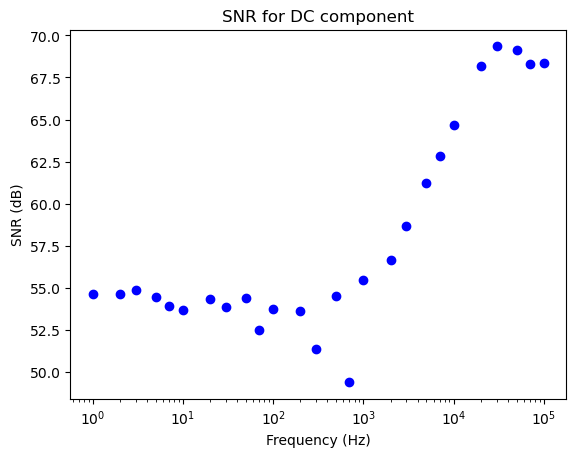

In [18]:
p_idx = 0
snr_dc_list = []

for step_idx, step in enumerate(p_list[p_idx]["p_data"]):
    # if step["freq"] != 1 : continue
    # print(f"freq: {step["freq"]}Hz")

    signal = np.array(step["data"])
    # laser_signal = np.array(next(exc["data"] for exc in exc_data_npy if exc["freq"] == step["freq"]))
    
    snr_dc_list.append([
        step["freq"],
        get_snr_db(signal[0,:,0], signal[:,:,1].mean(axis=0), freq=0),
    ])

snr_dc_list = np.array(snr_dc_list)


# snr_list
p_idx = 0
for idx, item in enumerate(p_list[p_idx]["error_bar"]):
    # Freq match
    if item[0] == snr_dc_list[idx,0]:
        plt.scatter(snr_dc_list[idx,0], snr_dc_list[idx,1], color="blue")


plt.title("SNR for DC component")
plt.ylabel("SNR (dB)")
plt.xlabel("Frequency (Hz)")
plt.xscale("log")
plt.show()


### Amplitudes

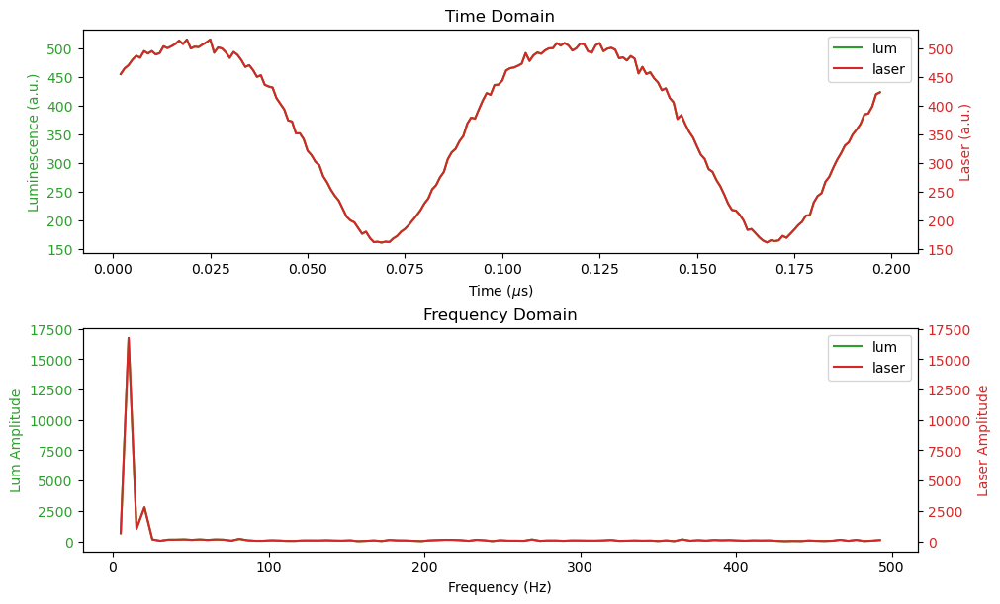

In [19]:
# particles_off = [i for i in range(num_particles) if i < 0]
# freqs_off = [30000, 50000, 70000, 100000]

for p_idx, p in enumerate(p_list):

    # if p_idx in particles_off: continue
    if p_idx != 0: continue
    # cmap = plt.get_cmap("coolwarm")
    # norm = mcolors.Normalize(vmin=0, vmax = (len(p_list)-1) )
    # c_grad = cmap(norm(len(p_list) - p_idx))
    for step_idx, step in enumerate(p["p_data"]):
        if step["freq"] != 10: continue
        # if step["freq"] in freqs_off: continue
        # if step["freq"]
        time = np.array(step["data"])[0,:,0]
        signal = np.array(step["data"])[:,:,1].mean(axis=0)
        plot_time_and_freq_domain(time, signal, signal)
        # plt.scatter(step["freq"], calculate_thd(time, signal, fundamental_freq=step["freq"], num_harmonics=num_harmonics), 
        #             color=c_grad,
        #             )


        

In [27]:
def calculate_harmonic_powers(time, curve, fundamental_freq, num_harmonics=5):
    """
    Calculates Total Harmonic Distortion (THD) for a given signal.
    Time has to be in us.
    """
    # 1. Obtém a FFT usando a sua função existente
    xf, yf = get_fft(time, curve)
    
    # 2. Mantém o termo DC e as frequências positivas
    mask_positive = xf > 0
    xf = xf[mask_positive]
    yf = yf[mask_positive]
        
    # Calculate magnitudes
    magnitudes = np.abs(yf)
    
    # Helper to find the magnitude peak closest to a target frequency
    def get_peak_magnitude(target_f):
        idx = np.argmin(np.abs(xf - target_f))
        return magnitudes[idx]

    # Get fundamental magnitude (V1)
    v1 = get_peak_magnitude(fundamental_freq)
    # plt.scatter(fundamental_freq, v1**2, color="b")
    
    
    p_spectrum = [[fundamental_freq, v1**2]]

    # Collect harmonic magnitudes (V2, V3, ..., Vn)
    
    for h in range(2, num_harmonics + 1):
        v_h = get_peak_magnitude(fundamental_freq * h)
        p_spectrum.append([fundamental_freq*h, v_h ** 2])
    
    return np.array(p_spectrum)

def calculate_noise_powers(time, curve, fundamental_freq):
    """
    Calculates Total Harmonic Distortion (THD) for a given signal.
    Time has to be in us.
    """
    # 1. Obtém a FFT usando a sua função existente
    xf, yf = get_fft(time, curve)
    
    # 2. Mantém o termo DC e as frequências positivas
    mask_positive = xf > 0
    xf = xf[mask_positive]
    yf = yf[mask_positive]

    print(len(xf), xf[len(xf)-1])
        
    # Calculate magnitudes
    powers = np.abs(yf)**2
    
    # Helper to find the magnitude peak closest to a target frequency
    def get_peak_power_and_idx(target_f):
        idx = np.argmin(np.abs(xf - target_f))
        return idx, powers[idx]

    # Get fundamental magnitude (V1)
    fund_idx , _ = get_peak_power_and_idx(fundamental_freq)
    # plt.scatter(fundamental_freq, v1**2, color="b")
        
    p_spectrum_noise = powers[4*fund_idx : 20*fund_idx]

    return p_spectrum_noise.mean(), p_spectrum_noise.std()

def plot_harmonic_power(particles, particles_off=[], freqs_off=[], laser_exc = []):
    
    for p_idx, p in enumerate(particles):
        if p_idx in particles_off: continue

        cmap = plt.get_cmap("coolwarm")
        norm = mcolors.Normalize(vmin=0, vmax = (len(particles)-1) )

        c_grad = cmap(norm(len(particles) - p_idx))

        for step_idx, step in enumerate(p["p_data"]):
            if step["freq"] in freqs_off: continue

            time = np.array(step["data"])[0,:,0]
            signal = np.array(step["data"])[:,:,1].mean(axis=0)

            p_spec_harm = calculate_harmonic_powers(time, signal, 
                            fundamental_freq = step["freq"], 
                            num_harmonics = 20,
                            )
            p_noise, p_std = calculate_noise_powers(time, signal,
                fundamental_freq=step["freq"],
            )
            # print(f"noise power: {p_noise}")
            plt.plot(p_spec_harm[:,0], 
                     (p_noise + 3*p_std)*np.ones(len(p_spec_harm[:,0])), 
                     "b--")
            plt.plot(p_spec_harm[:,0], 
                     (p_noise - 3*p_std)*np.ones(len(p_spec_harm[:,0])), 
                     "b--")

            plt.scatter(p_spec_harm[:,0], p_spec_harm[:,1], color = c_grad)
            plt.title(f"Power spectrum for {step["freq"]}Hz - laser power {power_label[p_idx]}mA")
            plt.ylabel("$|A(\omega)|^2$")
            plt.xlabel("f (Hz)")
            plt.yscale("log")
            plt.xscale("log")
            plt.show()

In [21]:
def plot_harmonic_power_gemini(particles, particles_off=[], freqs_off=[], laser_exc=[], power_label=[]):
    
    for p_idx, p in enumerate(particles):
        if p_idx in particles_off: continue

        # 1. Cria a figura e a grade de subplots (6 linhas, 4 colunas)
        # O figsize é ajustado para que os gráficos não fiquem espremidos
        fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(16, 20))
        
        # Define o título principal (suptitle) para toda a figura
        fig.suptitle(f"Laser power {power_label[p_idx]}mA", fontsize=18, fontweight='bold')
        
        # "Achata" a matriz 6x4 de eixos em uma lista 1D de 24 posições para facilitar o acesso
        axes_flat = axes.flatten()

        cmap = plt.get_cmap("coolwarm")
        # Pequena correção no vmax para evitar divisão por zero se houver apenas 1 partícula
        norm = mcolors.Normalize(vmin=0, vmax=max(1, len(particles)-1))
        c_grad = cmap(norm(len(particles) - p_idx))

        plot_idx = 0 # Contador para sabermos em qual subplot estamos

        for step_idx, step in enumerate(p["p_data"]):
            if step["freq"] in freqs_off: continue
            
            # Trava de segurança: se houver mais de 24 passos, evita erro de índice
            if plot_idx >= 24:
                print(f"Aviso: Mais de 24 frequências para a partícula {p_idx}. As extras não serão plotadas.")
                break

            # 2. Seleciona o subplot atual
            ax = axes_flat[plot_idx]

            time = np.array(step["data"])[0,:,0]
            signal = np.array(step["data"])[:,:,1].mean(axis=0)

            p_spec_harm = calculate_harmonic_powers(
                time, signal, 
                fundamental_freq=step["freq"], 
                num_harmonics=20
            )
            p_noise, p_std = calculate_noise_powers(
                time, signal,
                fundamental_freq=step["freq"]
            )

            # 3. Usa 'ax.plot' e 'ax.scatter' em vez de 'plt.*'
            ax.plot(p_spec_harm[:,0], (p_noise + 3*p_std)*np.ones(len(p_spec_harm[:,0])), "b--")
            ax.plot(p_spec_harm[:,0], (p_noise - 3*p_std)*np.ones(len(p_spec_harm[:,0])), "b--")
            ax.scatter(p_spec_harm[:,0], p_spec_harm[:,1], color=c_grad)
            
            # 4. Configura títulos e eixos (no formato ax.set_*)
            ax.set_title(f"{step['freq']} Hz", fontsize=12)
            ax.set_ylabel("$|A(\omega)|^2$")
            ax.set_xlabel("f (Hz)")
            ax.set_yscale("log")
            ax.set_xscale("log")

            plot_idx += 1

        # 5. Limpeza: Oculta subplots vazios caso a partícula tenha menos de 24 frequências válidas
        for i in range(plot_idx, len(axes_flat)):
            axes_flat[i].set_visible(False)

        # 6. Ajusta o layout para que os títulos não se sobreponham aos gráficos de cima
        plt.tight_layout()
        fig.subplots_adjust(top=0.93) # Dá um respiro pro suptitle não esmagar a primeira linha
        
        # Mostra o painel completo da partícula atual antes de ir para a próxima
        plt.show()

97 49.23857868020304
97 98.47715736040608
97 147.7305090915183
97 246.19289340101523
97 344.8079739510017
97 492.38578680203045
97 984.7715736040609
97 1478.6359964024937
97 2461.9289340101527
97 3467.50554085937
97 4923.857868020305
97 9847.71573604061
97 14920.781418243347
97 24619.289340101517
97 35170.413343002176
97 49259.103306580786
97 98559.2901021579
97 147900.61180536586
97 246192.89340101523
97 345533.8854751091
97 494445.9783786079
97 984771.5736040609
97 1477157.3604060917
97 2461928.9340101522
Aviso: Mais de 24 frequências para a partícula 0. As extras não serão plotadas.


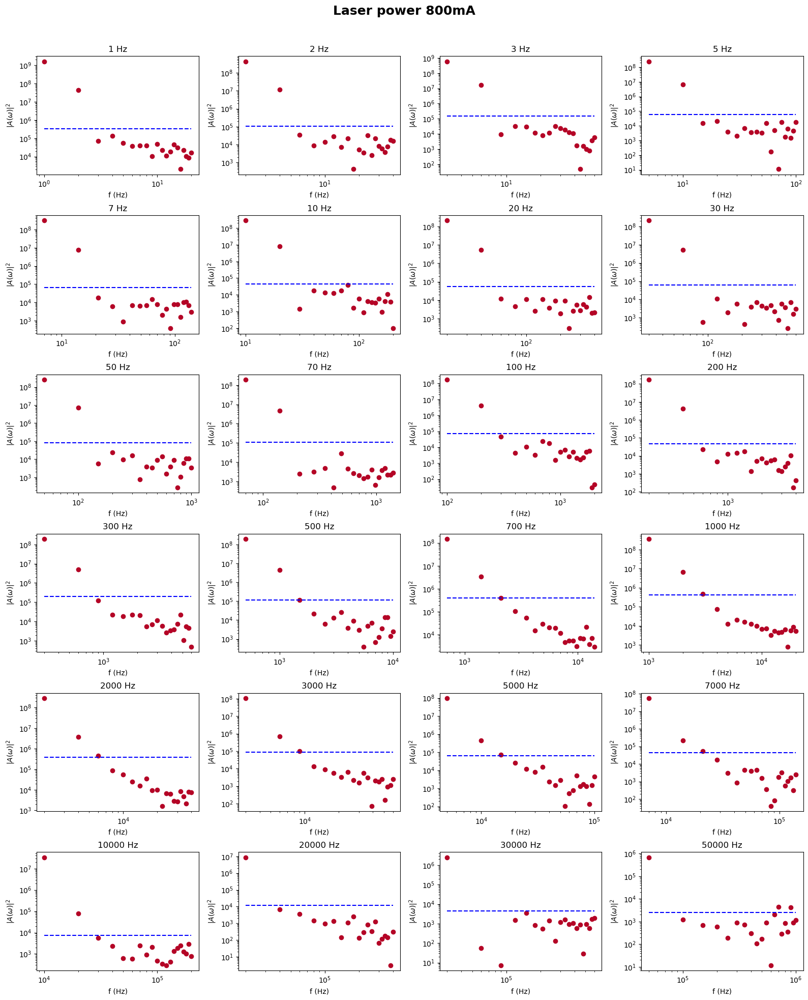

In [28]:
plot_harmonic_power_gemini(p_list, 
                    particles_off=[i for i in range(14) if i != 0],
                    power_label=power_label
                    )

### Total Harmonic Distortion (Incomplete)

In [24]:
snr_list = []

for step in exc_data_npy:
    time = np.array(step["data"])[0,:,0]
    signal = np.array(step["data"])[:,:,1].mean(axis=0)

    snr_list.append([
        step["amp"],
        step["offset"],
        get_snr_db(time, signal, freq=2) - get_snr_db(time, signal),
    ])

snr_list = np.array(snr_list)

In [25]:
def calculate_thd(time, curve, fundamental_freq, num_harmonics=5):
    """
    Calculates Total Harmonic Distortion (THD) for a given signal.
    Time has to be in us.
    """
    # 1. Obtém a FFT usando a sua função existente
    xf, yf = get_fft(time, curve)
    
    # 2. Mantém o termo DC e as frequências positivas
    mask_positive = xf > 0
    xf = xf[mask_positive]
    yf = yf[mask_positive]
        
    # Calculate magnitudes
    magnitudes = np.abs(yf)
    
    # Helper to find the magnitude peak closest to a target frequency
    def get_peak_magnitude(target_f):
        idx = np.argmin(np.abs(xf - target_f))
        return magnitudes[idx]

    # Get fundamental magnitude (V1)
    v1 = get_peak_magnitude(fundamental_freq)
    
    if v1 == 0:
        return 0.0

    # Collect harmonic magnitudes (V2, V3, ..., Vn)
    harmonic_sq_sum = 0.0
    for h in range(2, num_harmonics + 1):
        v_h = get_peak_magnitude(fundamental_freq * h)
        harmonic_sq_sum += v_h ** 2

    # Compute THD ratio and percentage
    thd_ratio = np.sqrt(harmonic_sq_sum) / v1
    return thd_ratio * 100

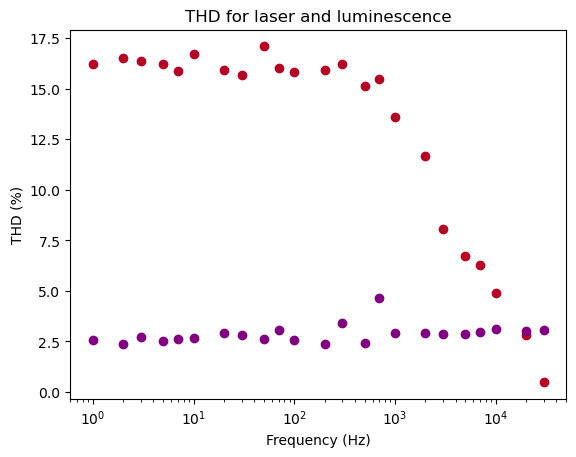

In [26]:
def plot_thd(particles, particles_off = [], freqs_off = [], laser_data = [], num_harmonics=3):

    for p_idx, p in enumerate(particles):
        if p_idx in particles_off: continue

        cmap = plt.get_cmap("coolwarm")
        norm = mcolors.Normalize(vmin=0, vmax = (len(p_list)-1) )

        c_grad = cmap(norm(len(p_list) - p_idx))

        for step_idx, step in enumerate(p["p_data"]):
            if step["freq"] in freqs_off: continue
            # if step["freq"]

            time = np.array(step["data"])[0,:,0]
            signal = np.array(step["data"])[:,:,1].mean(axis=0)
            plt.scatter(step["freq"], calculate_thd(time, signal, fundamental_freq=step["freq"], num_harmonics=num_harmonics), 
                        color=c_grad,
                        )
            
        

    if bool(laser_data):
        for step in laser_data:
            if step["freq"] in freqs_off: continue

            time = np.array(step["data"])[0,:,0]
            signal = np.array(step["data"])[:,:,1].mean(axis=0)

            plt.scatter(step["freq"], calculate_thd(time, signal, fundamental_freq=step["freq"], num_harmonics=num_harmonics), color="purple")

    plt.xscale("log")
    plt.ylabel("THD (%)")
    plt.xlabel("Frequency (Hz)")
    plt.title("THD for laser and luminescence")
    plt.show()

plot_thd(p_list, 
         particles_off = [i for i in range(14) if i > 0], 
         freqs_off = [ 50000, 70000, 100000], 
         laser_data = exc_data_npy,
         num_harmonics = 2,
         )
